# Import dependencies

In [1]:
%cd /kaggle/working
!git clone https://github.com/nv259/AFO-CS331.O11.KHTN.git
# !git pull https://github.com/nv259/AFO-CS331.O11.KHTN.git

/kaggle/working
Cloning into 'AFO-CS331.O11.KHTN'...
remote: Enumerating objects: 140, done.
remote: Counting objects: 100% (140/140), done.
remote: Compressing objects: 100% (103/103), done.
remote: Total 140 (delta 33), reused 126 (delta 23), pack-reused 0
Receiving objects: 100% (140/140), 9.79 MiB | 27.78 MiB/s, done.
Resolving deltas: 100% (33/33), done.


In [2]:
%cd /kaggle/working/AFO-CS331.O11.KHTN/
!git pull

/kaggle/working/AFO-CS331.O11.KHTN
Already up to date.


In [3]:
!pip install pycocotools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 7.5 MB/s eta 0:00:00


In [4]:
import os, glob
from pathlib import Path
from tqdm.auto import tqdm

import numpy as np
import cv2
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from my_utils import *

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms as T
from engine import evaluate

from torch.utils.tensorboard import SummaryWriter

from tqdm.auto import tqdm

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [6]:
classes = [_, "human", "wind/sup-board", "boat", "bouy", "sailboat", "kayak"]

# Hyperparameters
num_epochs = 50
lr = 0.001
momentum = 0.9
decay_rate = 0.0005
log_every_epochs = 5

# Working paths

In [7]:
# Set up img paths
data_dir = "/kaggle/input"
part_1 = os.path.join(data_dir, "afo-aerial-dataset-of-floating-objects/PART_1/PART_1/images/")
part_2 = os.path.join(data_dir, "afo-aerial-dataset-of-floating-objects/PART_2/PART_2/images/")
part_3 = os.path.join(data_dir, "afo-aerial-dataset-of-floating-objects/PART_3/PART_3/images/")

# Annotation paths
annotation_path = os.path.join(data_dir, "afo-aerial-dataset-of-floating-objects/PART_1/PART_1/6categories/")

In [8]:
!mkdir -p /kaggle/working/AFO-CS331.O11.KHTN/Dataset/images
!mkdir -p /kaggle/working/AFO-CS331.O11.KHTN/Dataset/labels

In [9]:
# Main working paths
working_dir = "/kaggle/working/AFO-CS331.O11.KHTN"
root_img_path = os.path.join(working_dir, "Dataset/images/")
root_ann_path = os.path.join(working_dir, "Dataset/labels/")

# Download AFO Dataset

## Set up

In [10]:
import shutil


# Copy files from our img paths to our image folder in our working directory
def copy_files(src, dest):
    files = os.listdir(src)
    for file in files:
        shutil.copy2(os.path.join(src,file), dest)

copy_files(part_1, root_img_path)
copy_files(part_2, root_img_path)
copy_files(part_3, root_img_path)
copy_files(annotation_path, root_ann_path)

## EDA & Visualizations

3641
(3840, 2160)


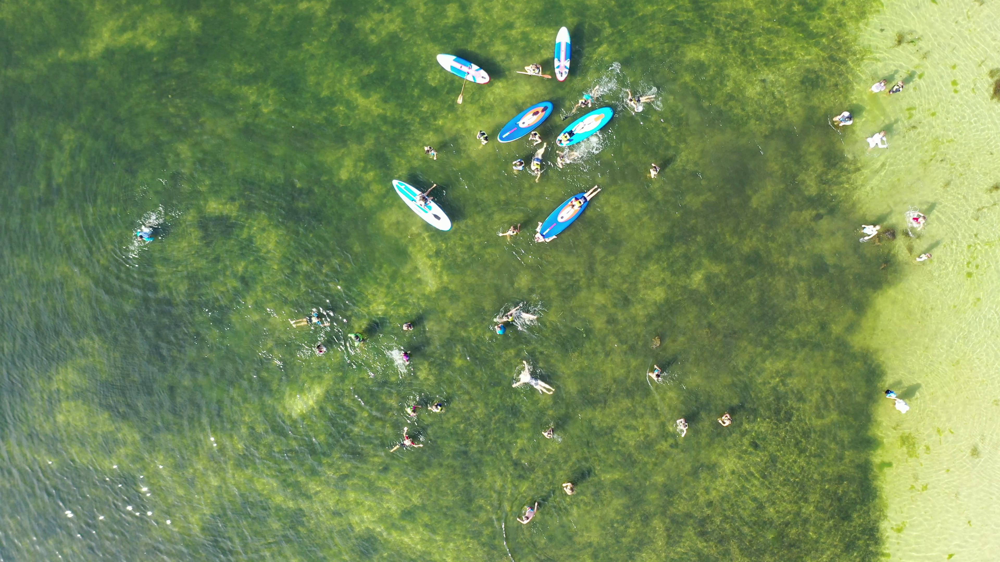

In [11]:
images_list = glob.glob(os.path.join(root_img_path, "*.jpg"))
print(len(images_list))

# Visualize a single image
img = Image.open(images_list[0])
print(img.size)
img

In [12]:
# Visualize a single annotation
annotations_list = glob.glob(os.path.join(root_ann_path, "*.txt"))

with open(annotations_list[0], 'r') as f:
    data = f.read()
    print(data)

0 0.1731 0.3280 0.0154 0.0321



# Split Data into Train, Test & Validation

In [13]:
# Recall:
# These have been then split into three parts: the training (67,4% of objects), the test (19,12% of objects),
# and the validation set (13,48% of objects). In order to prevent overfitting of the model to the given data,
# the test set contains selected frames from nine videos that were not used in either the training or validation sets.
from pathlib import Path
import shutil


def splitData(file_list, img_path, ann_path, mode):
    def checkFolder(root_path, mode):
        root_file = Path(root_path + mode)
        if not root_file.exists():
            print(f"Path {root_file} does not exist")
            os.makedirs(root_file)

    checkFolder(root_img_path, mode)
    checkFolder(root_ann_path, mode)

    # Creates the name of label file from the img name and source file
    for file in file_list:
        name = file.replace('.jpg', '')
        img_src_file = os.path.join(img_path, name + '.jpg')
        ann_src_file = os.path.join(ann_path, name + '.txt')

        # move image
        IMG_DIR = os.path.join(root_img_path, mode)
        img_dest_file = os.path.join(IMG_DIR, name + '.jpg')
        if os.path.isfile(img_src_file):
            shutil.move(img_src_file, img_dest_file)

        # copy annotations
        ANN_DIR = os.path.join(root_ann_path, mode)
        ann_dest_file = os.path.join(ANN_DIR, name + '.txt')
        if os.path.isfile(ann_src_file):
            shutil.move(ann_src_file, ann_dest_file)

In [14]:
train_images = os.path.join(data_dir, "afo-aerial-dataset-of-floating-objects/PART_1/PART_1/train.txt")
test_images = os.path.join(data_dir, "afo-aerial-dataset-of-floating-objects/PART_1/PART_1/test.txt")
val_images = os.path.join(data_dir, "afo-aerial-dataset-of-floating-objects/PART_1/PART_1/validation.txt")

with open(train_images, 'r') as f:
    train_images_list = [line.strip() for line in f.readlines()]

with open(test_images, 'r') as f:
    test_images_list = [line.strip() for line in f.readlines()]

with open(val_images, 'r') as f:
    val_images_list = [line.strip() for line in f.readlines()]

print(train_images_list[0], test_images_list[0], val_images_list[0])

a_102.jpg k2_38.jpg a_101.jpg


In [15]:
# Split data
splitData(train_images_list, root_img_path, root_ann_path, 'train')
splitData(test_images_list, root_img_path, root_ann_path, 'test')
splitData(val_images_list, root_img_path, root_ann_path, 'val')

Path /kaggle/working/AFO-CS331.O11.KHTN/Dataset/images/train does not exist
Path /kaggle/working/AFO-CS331.O11.KHTN/Dataset/labels/train does not exist
Path /kaggle/working/AFO-CS331.O11.KHTN/Dataset/images/test does not exist
Path /kaggle/working/AFO-CS331.O11.KHTN/Dataset/labels/test does not exist
Path /kaggle/working/AFO-CS331.O11.KHTN/Dataset/images/val does not exist
Path /kaggle/working/AFO-CS331.O11.KHTN/Dataset/labels/val does not exist


# Algorithms

## YOLOv8

### Set up

In [16]:
# !pip install ultralytics

In [17]:
# !mkdir /content/drive/MyDrive/FinalProject-CS321.O11/YOLOv8
# %cd /content/drive/MyDrive/FinalProject-CS321.O11/YOLOv8

### Usage

In [18]:
# # Creating a Yaml file for YOLO model
# import yaml


# dict_file = {
#     'path': '/content/drive/MyDrive/FinalProject-CS321.O11/Dataset',
#     'train': os.path.join(root_img_path, 'train'),
#     'val': os.path.join(root_img_path, 'val'),
#     'nc': 6,
#     'names': ['human', 'wind/sup-board', 'boat', 'bouy', 'sailboat', 'kayak']
# }

# with open('/content/drive/MyDrive/FinalProject-CS321.O11/YOLOv8/AFO.yaml', 'w+') as f:
#     documents = yaml.dump(dict_file, f)

In [19]:
# from ultralytics import YOLO


# model = YOLO('yolov8x.pt')

In [20]:
# results = model.train(data='/content/drive/MyDrive/FinalProject-CS321.O11/YOLOv8/AFO.yaml', epochs=10)

#### Freezing layers

In [21]:
# def freeze_layer(trainer):
#     model = trainer.model
#     num_freeze = 10
#     print(f"Freezing {num_freeze} layers")
#     freeze = [f'model.{x}.' for x in range(num_freeze)]  # layers to freeze
#     for k, v in model.named_parameters():
#         v.requires_grad = True  # train all layers
#         if any(x in k for x in freeze):
#             print(f'freezing {k}')
#             v.requires_grad = False
#     print(f"{num_freeze} layers are freezed.")

In [22]:
# model = YOLO("yolov8x.pt")
# model.add_callback("on_train_start", freeze_layer)
# model.train(data="./AFO.yaml")

## Faster R-CNN

In [23]:
# !mkdir /kaggle/working/AFO-CS331.O11.KHTN/faster-rcnn
# %cd /kaggle/working/AFO-CS331.O11.KHTN/faster-rcnn

In [24]:
# from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
# from torchvision.models.detection.faster_rcnn import FasterRCNN_ResNet50_FPN_Weights as fasterrcnn_weights

### Custom Dataset For Faster R-CNN

In [25]:
# train_dataset = AFODataset(mode='train', transform=transform, classes=classes)
# val_dataset = AFODataset(mode='val', transform=transform, classes=classes)
# # test_dataset = AFODataset(mode='test', transform=transform, classes=classes)

In [26]:
# train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=custom_collate, num_workers=2)
# val_loader = DataLoader(val_dataset, batch_size=8, shuffle=True, collate_fn=custom_collate, num_workers=2)
# # test_loader = DataLoader(test_dataset, batch_size=16, shuffle=True, collate_fn=custom_collate)

In [27]:
# torch.save(train_loader, '/content/drive/MyDrive/FinalProject-CS321.O11/Dataset/train_loader.pt')
# torch.save(val_loader, '/content/drive/MyDrive/FinalProject-CS321.O11/Dataset/val_loader.pt')
# # torch.save(test_loader, '/content/drive/MyDrive/FinalProject-CS321.O11/Dataset/train_loader.pt')

### Working space

In [28]:
# train_loader = torch.load('/content/drive/MyDrive/FinalProject-CS321.O11/Dataset/train_loader.pt')
# val_loader = torch.load('/content/drive/MyDrive/FinalProject-CS321.O11/Dataset/val_loader.pt')

In [29]:
# transform = fasterrcnn_weights.DEFAULT.transforms()

In [30]:
# model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights = 'DEFAULT')
# num_classes = 7
# in_features = model.roi_heads.box_predictor.cls_score.in_features
# model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
# optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay=decay_rate)

In [31]:
# # load best checkpoint
# checkpoint = torch.load("/content/drive/MyDrive/FinalProject-CS321.O11/faster-rcnn/best_checkpoint.pt")
# model.load_state_dict(checkpoint['model_state_dict'])
# model.to(device)
# optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
# last_step = checkpoint['epoch']
# best_val_loss = checkpoint['val_loss']

In [32]:
# writer = SummaryWriter("/content/drive/MyDrive/FinalProject-CS321.O11/faster-rcnn/runs/")

In [33]:
def train(model, optimizer, train_loader, last_step=-1, best_val_loss=None, save_dir=None):
    progress_bar = tqdm(range(num_epochs * len(train_loader)))
    train_losses = []
    val_losses = []

    # Loop over 1 epoch
    def train_one_epoch(model, optimizer, loader, epoch, mode="train"):
        torch.set_grad_enabled(mode=="train")
        epoch_loss = 0
        model.train()

        for batch in loader:
            imgs = []
            targets = []

            for sample in batch:
                imgs.append(sample[0].to(device))
                target = {}
                target["boxes"] = sample[1]["boxes"].to(device)
                target["labels"] = sample[1]["labels"].to(torch.int64).to(device)
                targets.append(target)

            ret_dict = model(imgs, targets)
            loss = sum(v for v in ret_dict.values())
            epoch_loss += loss.cpu().detach().numpy()

            if mode == "train":
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                progress_bar.update(1)

            writer.add_scalar("Loss/" + mode, epoch_loss, epoch)

        return epoch_loss

    if last_step != -1:
        print(f"Resuming from epoch: {last_step}  --  best val loss = {best_val_loss}")
        progress_bar.update((last_step + 1) * len(train_loader))

    for epoch in range(last_step + 1, num_epochs):
        train_loss = train_one_epoch(model, optimizer, train_loader, epoch)
        train_losses.append(train_loss)
        print(f"Epoch: {epoch}: train_loss = {train_loss}", end=' ')

        val_loss = train_one_epoch(model, optimizer, val_loader, epoch, mode="val")
        val_losses.append(val_loss)
        print(f"val_loss = {val_loss}")

        if best_val_loss is None or val_loss < best_val_loss:
            print("Best val loss found!")
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'train_loss': train_loss,
                'val_loss': val_loss,
            }, os.path.join(save_dir, "best_checkpoint.pt"))
            best_val_loss = val_loss

        # evaluate(model, val_loader, device=device)

        torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'train_loss': train_loss,
                'val_loss': val_loss,
            }, os.path.join(save_dir, "last_checkpoint.pt"))

    writer.flush()
    progress_bar.close()

In [34]:
# train(model, optimizer, train_loader, last_step, best_val_loss, save_dir="/content/drive/MyDrive/FinalProject-CS321.O11/faster-rcnn")

In [35]:
# img = Image.open("/content/drive/MyDrive/FinalProject-CS321.O11/Dataset/images/val/e_35.jpg")
# img

In [36]:
# model.eval()
# with torch.no_grad():
#     pred = model([transform(img).to(device)])

In [37]:
# drawAnnotation(img, pred[0]["boxes"].to(int).to('cpu').tolist())

## RetinaNet

In [38]:
!mkdir /kaggle/working/AFO-CS331.O11.KHTN/RetinaNet
%cd /kaggle/working/AFO-CS331.O11.KHTN/RetinaNet

mkdir: cannot create directory ‘/kaggle/working/AFO-CS331.O11.KHTN/RetinaNet’: File exists
/kaggle/working/AFO-CS331.O11.KHTN/RetinaNet


In [39]:
from functools import partial
from torchvision.models.detection.retinanet import RetinaNet_ResNet50_FPN_Weights as retinanet_weights, RetinaNetClassificationHead

In [40]:
transform = retinanet_weights.DEFAULT.transforms()
train_dataset = AFODataset(mode='train', transform=transform, classes=classes, root_img_path=root_img_path, root_ann_path=root_ann_path)
val_dataset = AFODataset(mode='val', transform=transform, classes=classes, root_img_path=root_img_path, root_ann_path=root_ann_path)
# test_dataset = AFODataset(mode='test', transform=transform, classes=classes)

  0%|          | 0/2787 [00:00<?, ?it/s]

Total removed background images: 720
2787 -- 2067


  0%|          | 0/339 [00:00<?, ?it/s]

Total removed background images: 8
339 -- 331


In [41]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=custom_collate, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=True, collate_fn=custom_collate, num_workers=4)
# test_loader = DataLoader(test_dataset, batch_size=16, shuffle=True, collate_fn=custom_collate)

In [42]:
writer = SummaryWriter("/kaggle/working/AFO-CS331.O11.KHTN/RetinaNet/runs/")

In [43]:
# !ls /kaggle/working/AFO-CS331.O11.KHTN/RetinaNet/runs

In [44]:
model = torchvision.models.detection.retinanet_resnet50_fpn(weights="DEFAULT")
num_anchors = model.head.classification_head.num_anchors

model.head.classification_head = RetinaNetClassificationHead(
    in_channels=256,
    num_anchors=num_anchors,
    num_classes=7,
    norm_layer=partial(torch.nn.GroupNorm, 32)
)

model.to(device)

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eeacb38b.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_coco-eeacb38b.pth
100%|██████████| 130M/130M [00:00<00:00, 246MB/s]


RetinaNet(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256, eps=0.0)


In [45]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

In [46]:
!pip install gdown
!gdown --id 1PeL-jHkS0YRnfYcLuHnAQVbmiS6LAe6W

/opt/conda/lib/python3.10/site-packages/gdown/cli.py:126: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (uriginal): https://drive.google.com/uc?id=1PeL-jHkS0YRnfYcLuHnAQVbmiS6LAe6W
From (redirected): https://drive.google.com/uc?id=1PeL-jHkS0YRnfYcLuHnAQVbmiS6LAe6W&confirm=t&uuid=593e842c-1c33-4802-91ca-31ef75ec3202
To: /kaggle/working/AFO-CS331.O11.KHTN/RetinaNet/best_checkpoint.pt
100%|█████████████████████████████████████████| 386M/386M [00:03<00:00, 101MB/s]


In [47]:
# load best checkpoint
checkpoint = torch.load("best_checkpoint.pt", map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
last_step = checkpoint['epoch']
best_val_loss = checkpoint['val_loss']

In [48]:
train(model, optimizer, train_loader, last_step=last_step, best_val_loss=best_val_loss, save_dir="/kaggle/working/AFO-CS331.O11.KHTN/RetinaNet")

  0%|          | 0/12950 [00:00<?, ?it/s]

Resuming from epoch: 18  --  best val loss = 19.56655713915825
Epoch: 19: train_loss = 84.54212664067745 val_loss = 19.655785620212555
Epoch: 20: train_loss = 81.70960515737534 val_loss = 19.310584634542465
Best val loss found!
Epoch: 21: train_loss = 68.86069850623608 val_loss = 19.590789169073105
Epoch: 22: train_loss = 66.3693315833807 val_loss = 19.95180293917656
Epoch: 23: train_loss = 65.0504272133112 val_loss = 19.96307784318924
Epoch: 24: train_loss = 71.61525298655033 val_loss = 20.375008046627045
Epoch: 25: train_loss = 63.40858545899391 val_loss = 19.609153360128403
Epoch: 26: train_loss = 58.14101815968752 val_loss = 19.84147399663925
Epoch: 27: train_loss = 63.04205223917961 val_loss = 20.23686319589615
Epoch: 28: train_loss = 78.27230702340603 val_loss = 19.971803963184357
Epoch: 29: train_loss = 60.49902296066284 val_loss = 19.192386388778687
Best val loss found!
Epoch: 30: train_loss = 55.48576416820288 val_loss = 19.854938328266144
Epoch: 31: train_loss = 53.4218915179

In [49]:
# !zip -r runs.zip /kaggle/working/AFO-CS331.O11.KHTN/RetinaNet/runs

In [50]:
# from IPython.display import FileLink
# FileLink(r'runs.zip')

## SSD300

In [51]:
!mkdir /kaggle/working/AFO-CS331.O11.KHTN/ssd300
%cd /kaggle/working/AFO-CS331.O11.KHTN/ssd300

/kaggle/working/AFO-CS331.O11.KHTN/ssd300


In [52]:
from torchvision.models.detection.ssd import SSD300_VGG16_Weights as ssd300_weights
from torchvision.models.detection.ssd import SSDClassificationHead, SSDHead

In [53]:
transform = ssd300_weights.DEFAULT.transforms()
train_dataset = AFODataset(mode='train', transform=transform, classes=classes, root_img_path=root_img_path, root_ann_path=root_ann_path)
val_dataset = AFODataset(mode='val', transform=transform, classes=classes, root_img_path=root_img_path, root_ann_path=root_ann_path)

  0%|          | 0/2787 [00:00<?, ?it/s]

Total removed background images: 720
2787 -- 2067


  0%|          | 0/339 [00:00<?, ?it/s]

Total removed background images: 8
339 -- 331


In [54]:
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=custom_collate, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=True, collate_fn=custom_collate, num_workers=4)

In [55]:
writer = SummaryWriter("/kaggle/working/AFO-CS331.O11.KHTN/ssd300/runs")

In [56]:
model = torchvision.models.detection.ssd300_vgg16(weights="DEFAULT", trainable_backbone_layers=2)
model.head = SSDHead(in_channels = [512, 1024, 512, 256, 256, 256],
                     num_anchors = model.anchor_generator.num_anchors_per_location(),
                     num_classes=7)

model.to(device)
model

Downloading: "https://download.pytorch.org/models/ssd300_vgg16_coco-b556d3b4.pth" to /root/.cache/torch/hub/checkpoints/ssd300_vgg16_coco-b556d3b4.pth
100%|██████████| 136M/136M [00:00<00:00, 238MB/s]


SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [57]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.002, momentum=0.9, weight_decay=decay_rate)

In [58]:
train(model, optimizer, train_loader, save_dir="/kaggle/working/AFO-CS331.O11.KHTN/ssd300")

  0%|          | 0/6500 [00:00<?, ?it/s]

Epoch: 0: train_loss = 999.0591678619385 val_loss = 113.93867254257202
Best val loss found!
Epoch: 1: train_loss = 640.157338142395 val_loss = 101.38386344909668
Best val loss found!
Epoch: 2: train_loss = 576.4961168766022 val_loss = 89.68011951446533
Best val loss found!
Epoch: 3: train_loss = 529.8718793392181 val_loss = 85.95710730552673
Best val loss found!
Epoch: 4: train_loss = 499.4566957950592 val_loss = 82.74557065963745
Best val loss found!
Epoch: 5: train_loss = 469.13710951805115 val_loss = 79.60244488716125
Best val loss found!
Epoch: 6: train_loss = 445.66416454315186 val_loss = 76.79401969909668
Best val loss found!
Epoch: 7: train_loss = 422.24580454826355 val_loss = 75.48507928848267
Best val loss found!
Epoch: 8: train_loss = 399.30950260162354 val_loss = 73.2682876586914
Best val loss found!
Epoch: 9: train_loss = 383.2774922847748 val_loss = 71.62371563911438
Best val loss found!
Epoch: 10: train_loss = 369.76798367500305 val_loss = 71.52578926086426
Best val loss 